In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers
from tensorflow_examples.models.pix2pix import pix2pix
AUTOTUNE = tf.data.AUTOTUNE

import os
import time
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
from tqdm import tqdm
from PIL import Image

#Clases
from ganUtils import PrepareImages, Discriminator_loss, Generator_loss, Generate_single_images
from ganUtils import Calc_cycle_loss, Identity_loss, Generate_images, Train_step, CompararImagen

In [2]:
pathBase = "my_dataset/"          # Directorio de data
pathTrain=pathBase+'train/'      # Directorio de train
pathMultEnf=pathTrain+'multiples_enfermedades/'
pathOxido=pathTrain+'oxido/'
pathCostra=pathTrain+'costra/'
pathSaludable=pathTrain+'saludable/'

In [3]:
GenSquare = 256
# BATCH_SIZE = 128
BufferSize = 1000
BATCH_SIZE = 1

In [4]:
def CargarCheckpoint(checkpoint_path):
    ckpt = tf.train.Checkpoint(generator_g=generator_g,
                               generator_f=generator_f,
                               discriminator_x=discriminator_x,
                               discriminator_y=discriminator_y,
                               generator_g_optimizer=generator_g_optimizer,
                               generator_f_optimizer=generator_f_optimizer,
                               discriminator_x_optimizer=discriminator_x_optimizer,
                               discriminator_y_optimizer=discriminator_y_optimizer)

    ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

    # Si existe un checkpoint previo carcarlo
    if ckpt_manager.latest_checkpoint:
        ckpt.restore(ckpt_manager.latest_checkpoint)
        print ('Ultimo checkpoint cargado')
    return ckpt_manager

## Saludable -> Oxido

In [5]:
# Carga y acondicionamiento de datos
train_inicial, test_inicial = PrepareImages(pathSaludable, GenSquare)
train_objetivo, test_objetivo = PrepareImages(pathOxido, GenSquare)

sample_inicial = next(iter(train_inicial))
sample_objetivo = next(iter(train_objetivo))

Found 516 files belonging to 1 classes.
Using 465 files for training.
Found 516 files belonging to 1 classes.
Using 51 files for validation.
Found 622 files belonging to 1 classes.
Using 560 files for training.
Found 622 files belonging to 1 classes.
Using 62 files for validation.


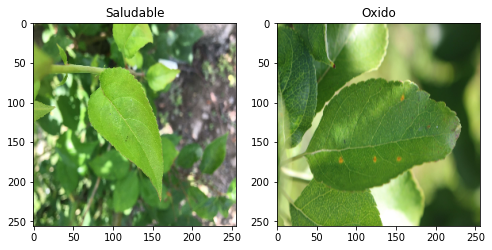

In [6]:
# Mostrar un ejemplo de cada grupo
img1 = sample_inicial[0] * 0.5 + 0.5
img2 = sample_objetivo[0] * 0.5 + 0.5
CompararImagen(img1, img2, 'Saludable', 'Oxido')

In [6]:
outputChannels = 3

generator_g = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


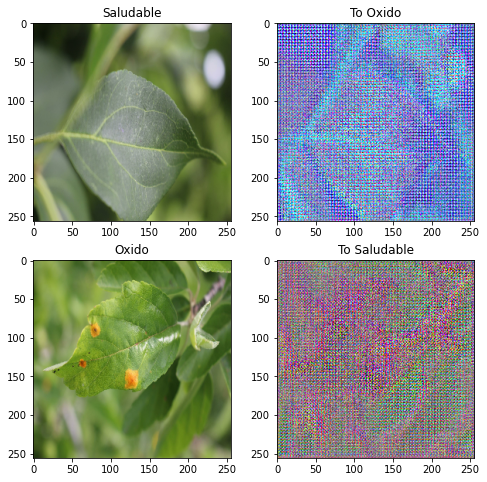

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

In [8]:
# Mostrar ejemplos iniciales con redes sin entrenar
to_objetivo = generator_g(sample_inicial)
to_inicial = generator_f(sample_objetivo)
plt.figure(figsize=(8, 8))
contrast = 4

imgs = [sample_inicial, to_objetivo, sample_objetivo, to_inicial]
title = ['Saludable', 'To Oxido', 'Oxido', 'To Saludable']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0] * 0.5 + 0.5)
    else:
        plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

plt.figure(figsize=(8, 8))

In [7]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [8]:
checkpoint_path = "./checkpoints/saludable-oxido/train"
ckpt_manager = CargarCheckpoint(checkpoint_path)

Ultimo checkpoint cargado


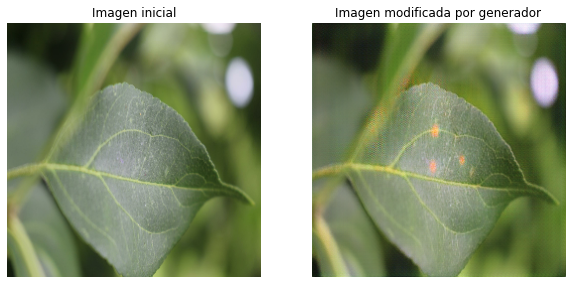

Time taken for epoch 1 is 698.4125683307648 sec



In [11]:
# Entrenamiento
EPOCHS = 1
# EPOCHS = 100
for epoch in range(EPOCHS):
    start = time.time()
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_inicial, train_objetivo)):
        Train_step(image_x, image_y, generator_g, generator_f,
                   discriminator_x, discriminator_y, loss_obj,
                   LAMBDA, generator_g_optimizer, generator_f_optimizer,
                   discriminator_x_optimizer, discriminator_y_optimizer)
        if n % 10 == 0:
            print ('.', end='')
        n += 1
    clear_output(wait=True)
    
    # Crear imagen para mostrar comparación
    Generate_images(generator_g, sample_inicial)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))


Ejemplo de imagenes creadas por generador g



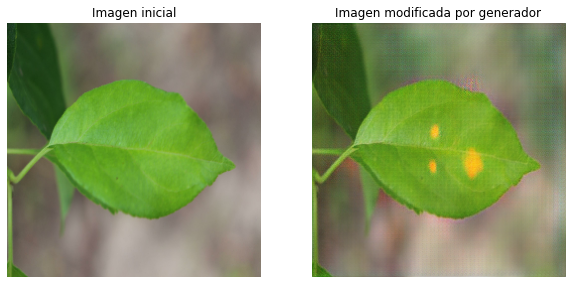

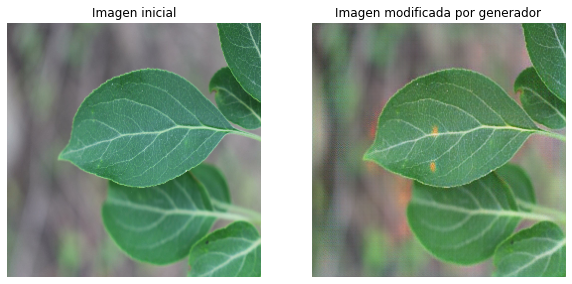

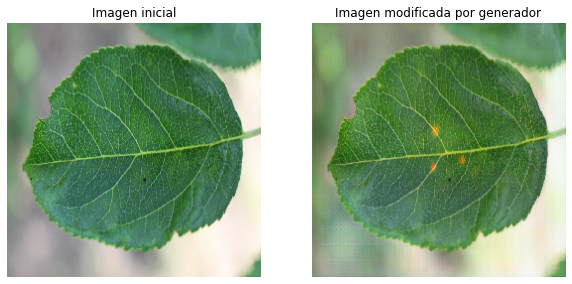

In [17]:
# Imagenes de ejemplo para comparar antes y despues
print("\nEjemplo de imagenes creadas por generador g\n")
for inp in train_inicial.take(3):
    Generate_images(generator_g, inp)

In [9]:
# Generar imagenes individuales
# crear a partir de modelos entrenados
i = 0
for inp in train_inicial:
    i += 1
    Generate_single_images(generator_g, inp, f'imagenesGeneradasCgan/saludable_a_oxido/{i}')

## Saludable -> Costra

Found 592 files belonging to 1 classes.
Using 533 files for training.
Found 592 files belonging to 1 classes.
Using 59 files for validation.
Found 516 files belonging to 1 classes.
Using 465 files for training.
Found 516 files belonging to 1 classes.
Using 51 files for validation.


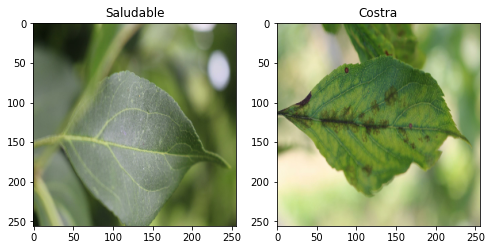

In [10]:
# Carga y acondicionamiento de datos
train_objetivo, test_objetivo_1 = PrepareImages(pathCostra, GenSquare)
train_inicial, test_inicial_1 = PrepareImages(pathSaludable, GenSquare)

sample_objetivo = next(iter(train_objetivo))
sample_inicial = next(iter(train_inicial))

# Mostrar un ejemplo de cada grupo
img1 = sample_inicial[0] * 0.5 + 0.5
img2 = sample_objetivo[0] * 0.5 + 0.5
CompararImagen(img1, img2, 'Saludable', 'Costra')

In [11]:
outputChannels = 3

generator_g = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [13]:
checkpoint_path = "./checkpoints/saludable-costra/train"
ckpt_manager = CargarCheckpoint(checkpoint_path)

Ultimo checkpoint cargado


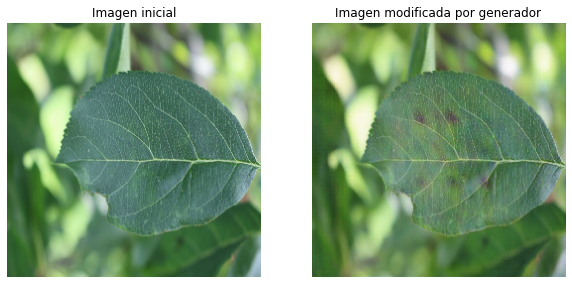

Time taken for epoch 1 is 705.4389827251434 sec



In [12]:
# Entrenamiento
EPOCHS = 1
for epoch in range(EPOCHS):
    start = time.time()
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_inicial, train_objetivo)):
        Train_step(image_x, image_y, generator_g, generator_f,
                   discriminator_x, discriminator_y, loss_obj,
                   LAMBDA, generator_g_optimizer, generator_f_optimizer,
                   discriminator_x_optimizer, discriminator_y_optimizer)
        if n % 10 == 0:
            print ('.', end='')
        n += 1
    clear_output(wait=True)
    
    # Crear imagen para mostrar comparación
    Generate_images(generator_g, sample_inicial)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))


Ejemplo de imagenes creadas por generador g



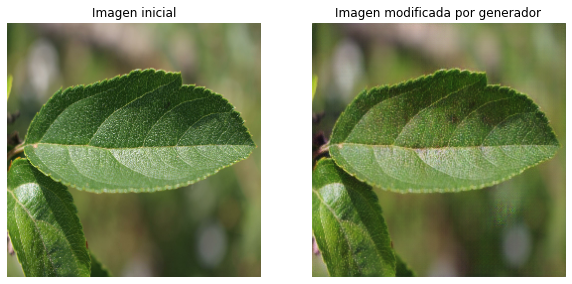

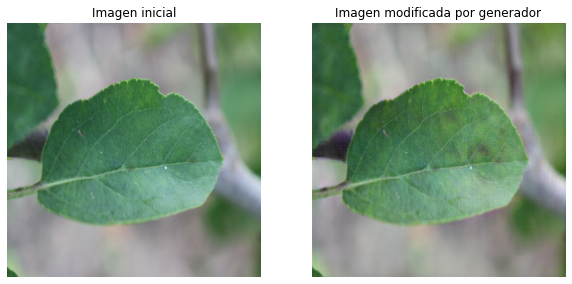

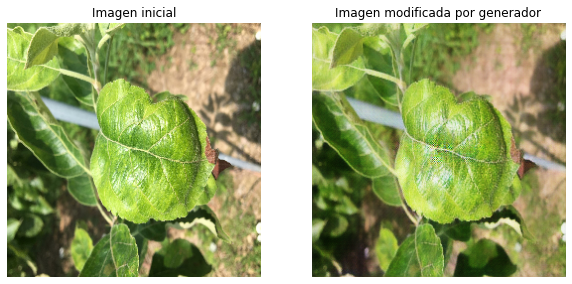

In [13]:
# Imagenes de ejemplo para comparar antes y despues
print("\nEjemplo de imagenes creadas por generador g\n")
for inp in train_inicial.take(3):
    Generate_images(generator_g, inp)

In [14]:
# Generar imagenes individuales
# crear a partir de modelos entrenados
i = 0
for inp in train_inicial:
    i += 1
    Generate_single_images(generator_g, inp, f'imagenesGeneradasCgan/saludable_a_costra/{i}')

## Saludable -> Multiples Enfermedades

Found 91 files belonging to 1 classes.
Using 82 files for training.
Found 91 files belonging to 1 classes.
Using 9 files for validation.
Found 516 files belonging to 1 classes.
Using 465 files for training.
Found 516 files belonging to 1 classes.
Using 51 files for validation.


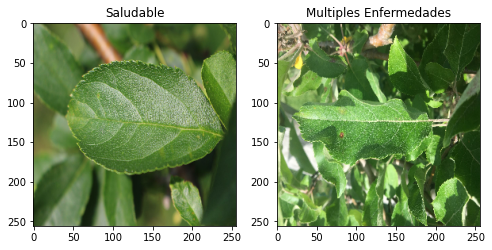

In [15]:
# Carga y acondicionamiento de datos
train_objetivo, test_objetivo = PrepareImages(pathMultEnf, GenSquare)
train_inicial, test_inicial = PrepareImages(pathSaludable, GenSquare)

sample_objetivo = next(iter(train_objetivo))
sample_inicial = next(iter(train_inicial))

# Mostrar un ejemplo de cada grupo
img1 = sample_inicial[0] * 0.5 + 0.5
img2 = sample_objetivo[0] * 0.5 + 0.5
CompararImagen(img1, img2, 'Saludable', 'Multiples Enfermedades')

In [7]:
outputChannels = 3

generator_g = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [16]:
checkpoint_path = "./checkpoints/saludable-multEnf/train"
ckpt_manager = CargarCheckpoint(checkpoint_path)

Ultimo checkpoint cargado


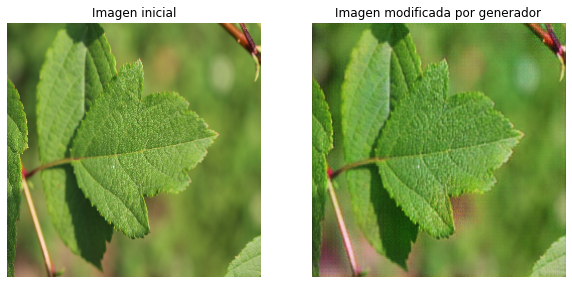

Time taken for epoch 1 is 150.2538070678711 sec



In [9]:
# Entrenamiento
EPOCHS = 1
for epoch in range(EPOCHS):
    start = time.time()
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_inicial, train_objetivo)):
        Train_step(image_x, image_y, generator_g, generator_f,
                   discriminator_x, discriminator_y, loss_obj,
                   LAMBDA, generator_g_optimizer, generator_f_optimizer,
                   discriminator_x_optimizer, discriminator_y_optimizer)
        if n % 10 == 0:
            print ('.', end='')
        n += 1
    clear_output(wait=True)
    
    # Crear imagen para mostrar comparación
    Generate_images(generator_g, sample_inicial)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))


Ejemplo de imagenes creadas por generador g



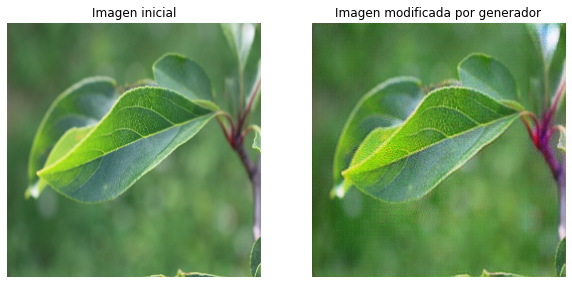

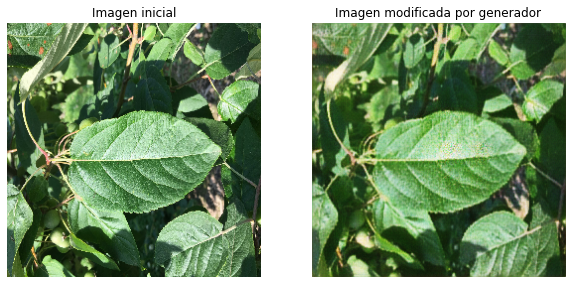

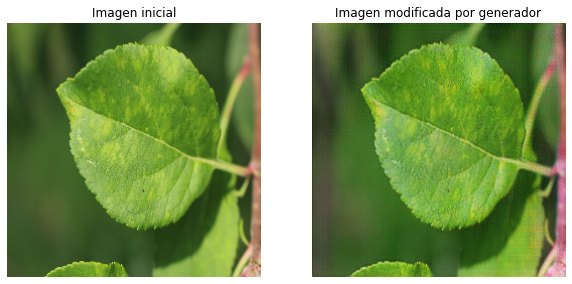

In [10]:
print("\nEjemplo de imagenes creadas por generador g\n")
for inp in train_inicial.take(3):
    Generate_images(generator_g, inp)

In [17]:
# Generar imagenes individuales
# crear a partir de modelos entrenados
i = 0
for inp in train_inicial:
    i += 1
    Generate_single_images(generator_g, inp, f'imagenesGeneradasCgan/saludable_a_multEnf/{i}')

## Costra -> Multiples Enfermedades

Found 91 files belonging to 1 classes.
Using 82 files for training.
Found 91 files belonging to 1 classes.
Using 9 files for validation.
Found 592 files belonging to 1 classes.
Using 533 files for training.
Found 592 files belonging to 1 classes.
Using 59 files for validation.


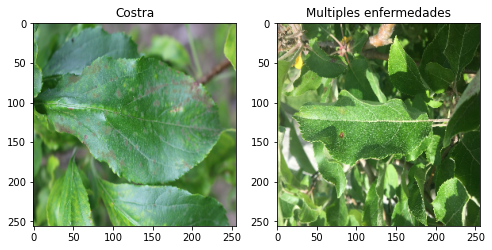

In [18]:
# Carga y acondicionamiento de datos
train_objetivo, test_objetivo = PrepareImages(pathMultEnf, GenSquare)
train_inicial, test_inicial = PrepareImages(pathCostra, GenSquare)

sample_objetivo = next(iter(train_objetivo))
sample_inicial = next(iter(train_inicial))

# Mostrar un ejemplo de cada grupo
img1 = sample_inicial[0] * 0.5 + 0.5
img2 = sample_objetivo[0] * 0.5 + 0.5
CompararImagen(img1, img2, 'Costra', 'Multiples enfermedades')

In [19]:
outputChannels = 3

generator_g = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [21]:
checkpoint_path = "./checkpoints/costra-multEnf/train"
ckpt_manager = CargarCheckpoint(checkpoint_path)

Ultimo checkpoint cargado


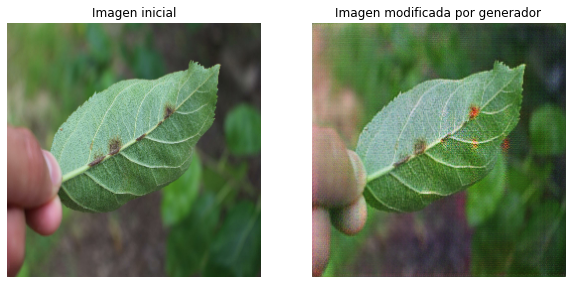

Time taken for epoch 1 is 154.34043526649475 sec



In [9]:
# Entrenamiento
EPOCHS = 1
for epoch in range(EPOCHS):
    start = time.time()
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_inicial, train_objetivo)):
        Train_step(image_x, image_y, generator_g, generator_f,
                   discriminator_x, discriminator_y, loss_obj,
                   LAMBDA, generator_g_optimizer, generator_f_optimizer,
                   discriminator_x_optimizer, discriminator_y_optimizer)
        if n % 10 == 0:
            print ('.', end='')
        n += 1
    clear_output(wait=True)
    
    # Crear imagen para mostrar comparación
    Generate_images(generator_g, sample_inicial)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))


Ejemplo de imagenes creadas por generador g



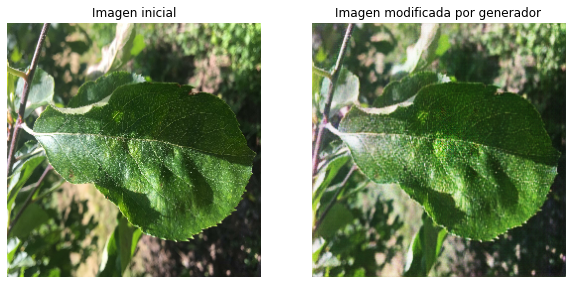

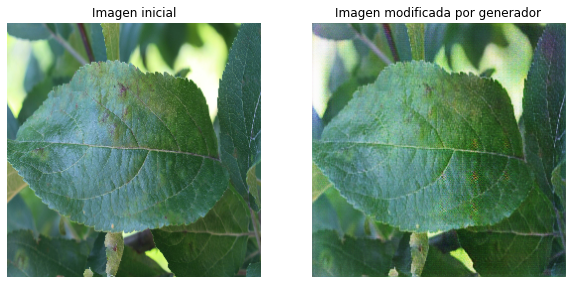

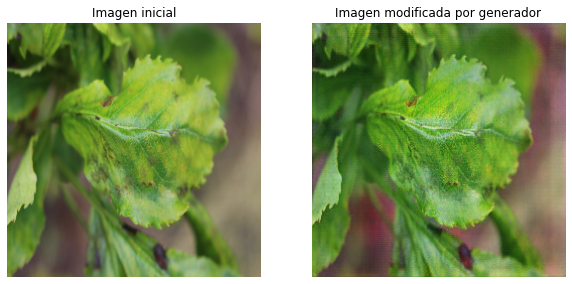

In [10]:
print("\nEjemplo de imagenes creadas por generador g\n")
for inp in train_inicial.take(3):
    Generate_images(generator_g, inp)

In [22]:
# Generar imagenes individuales
# crear a partir de modelos entrenados
i = 0
for inp in train_inicial:
    i += 1
    Generate_single_images(generator_g, inp, f'imagenesGeneradasCgan/costra_a_multEnf/{i}')

## Oxido -> Multiples Enfermedades

Found 91 files belonging to 1 classes.
Using 82 files for training.
Found 91 files belonging to 1 classes.
Using 9 files for validation.
Found 622 files belonging to 1 classes.
Using 560 files for training.
Found 622 files belonging to 1 classes.
Using 62 files for validation.


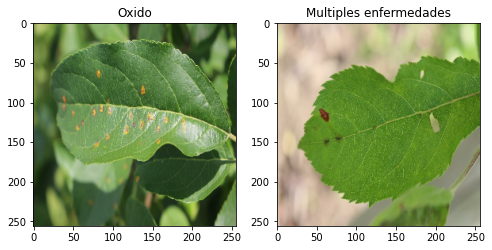

In [23]:
# Carga y acondicionamiento de datos
train_objetivo, test_objetivo = PrepareImages(pathMultEnf, GenSquare)
train_inicial, test_inicial = PrepareImages(pathOxido, GenSquare)

sample_objetivo = next(iter(train_objetivo))
sample_inicial = next(iter(train_inicial))

# Mostrar un ejemplo de cada grupo
img1 = sample_inicial[0] * 0.5 + 0.5
img2 = sample_objetivo[0] * 0.5 + 0.5
CompararImagen(img1, img2, 'Oxido', 'Multiples enfermedades')

In [24]:
outputChannels = 3

generator_g = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [25]:
checkpoint_path = "./checkpoints/oxido-multEnf/train"
ckpt_manager = CargarCheckpoint(checkpoint_path)

Ultimo checkpoint cargado


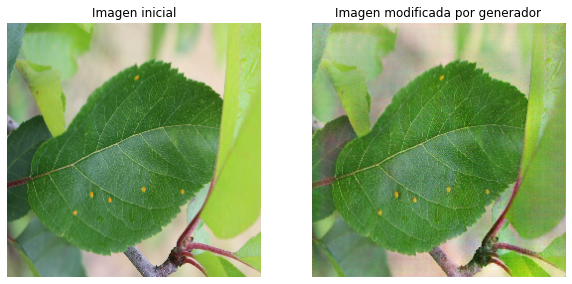

Time taken for epoch 1 is 152.4216752052307 sec



In [8]:
# Entrenamiento
EPOCHS = 1
for epoch in range(EPOCHS):
    start = time.time()
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_inicial, train_objetivo)):
        Train_step(image_x, image_y, generator_g, generator_f,
                   discriminator_x, discriminator_y, loss_obj,
                   LAMBDA, generator_g_optimizer, generator_f_optimizer,
                   discriminator_x_optimizer, discriminator_y_optimizer)
        if n % 10 == 0:
            print ('.', end='')
        n += 1
    clear_output(wait=True)
    
    # Crear imagen para mostrar comparación
    Generate_images(generator_g, sample_inicial)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))


Ejemplo de imagenes creadas por generador g



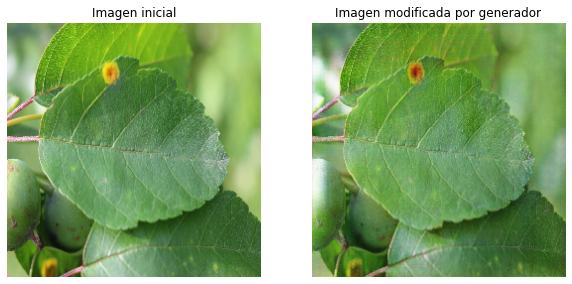

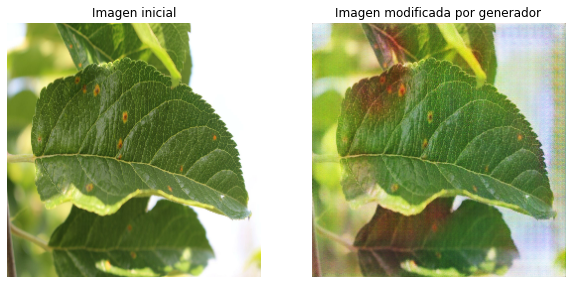

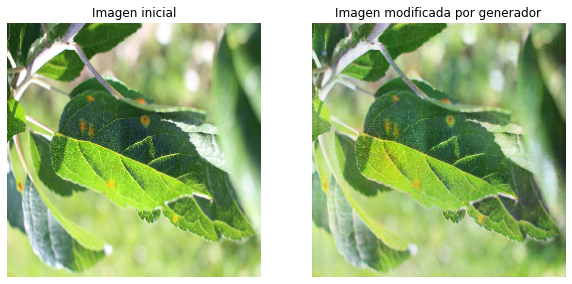

In [10]:
print("\nEjemplo de imagenes creadas por generador g\n")
for inp in train_inicial.take(3):
    Generate_images(generator_g, inp)

In [26]:
# Generar imagenes individuales
# crear a partir de modelos entrenados
i = 0
for inp in train_inicial:
    i += 1
    Generate_single_images(generator_g, inp, f'imagenesGeneradasCgan/oxido_a_multEnf/{i}')

## Costra - Oxido

Found 622 files belonging to 1 classes.
Using 560 files for training.
Found 622 files belonging to 1 classes.
Using 62 files for validation.
Found 592 files belonging to 1 classes.
Using 533 files for training.
Found 592 files belonging to 1 classes.
Using 59 files for validation.


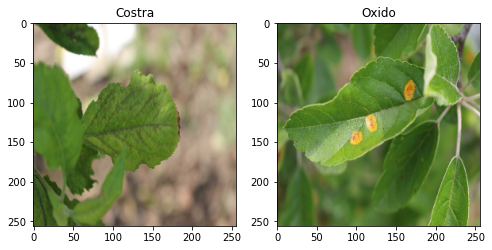

In [27]:
# Carga y acondicionamiento de datos
train_objetivo, test_objetivo = PrepareImages(pathOxido, GenSquare)
train_inicial, test_inicial = PrepareImages(pathCostra, GenSquare)

sample_objetivo = next(iter(train_objetivo))
sample_inicial = next(iter(train_inicial))

# Mostrar un ejemplo de cada grupo
img1 = sample_inicial[0] * 0.5 + 0.5
img2 = sample_objetivo[0] * 0.5 + 0.5
CompararImagen(img1, img2, 'Costra', 'Oxido')

In [28]:
outputChannels = 3

generator_g = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(outputChannels, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_g_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)

In [30]:
checkpoint_path = "./checkpoints/costra-oxido/train"
ckpt_manager = CargarCheckpoint(checkpoint_path)

Ultimo checkpoint cargado


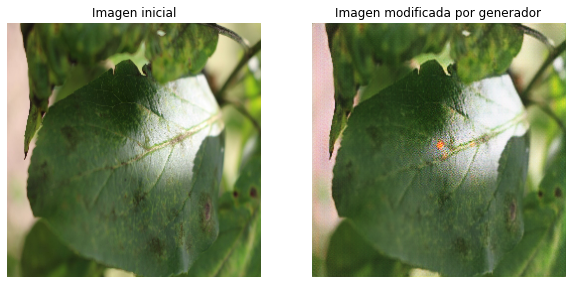

Time taken for epoch 1 is 773.4331200122833 sec



In [8]:
# Entrenamiento
EPOCHS = 1
for epoch in range(EPOCHS):
    start = time.time()
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_inicial, train_objetivo)):
        Train_step(image_x, image_y, generator_g, generator_f,
                   discriminator_x, discriminator_y, loss_obj,
                   LAMBDA, generator_g_optimizer, generator_f_optimizer,
                   discriminator_x_optimizer, discriminator_y_optimizer)
        if n % 10 == 0:
            print ('.', end='')
        n += 1
    clear_output(wait=True)
    
    # Crear imagen para mostrar comparación
    Generate_images(generator_g, sample_inicial)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))


Ejemplo de imagenes creadas por generador g



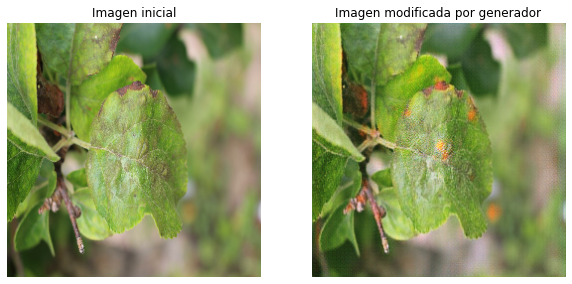

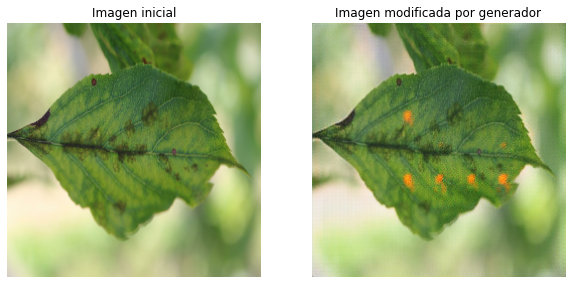

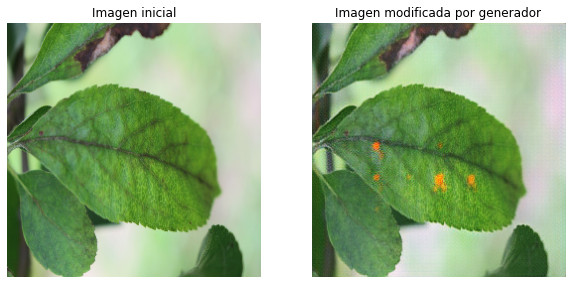

In [9]:
print("\nEjemplo de imagenes creadas por generador g\n")
for inp in train_inicial.take(3):
    Generate_images(generator_g, inp)

In [31]:
# Generar imagenes individuales
# crear a partir de modelos entrenados
i = 0
for inp in train_inicial:
    i += 1
    Generate_single_images(generator_g, inp, f'imagenesGeneradasCgan/costra_a_oxido/{i}')